# Figure S6A
#### ovary cancer sample - overview

In [1]:
#!pip install -q observable_jupyter==0.1.10
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from copy import deepcopy
from observable_jupyter import embed
from math import cos, sin
#
import s3fs
import os

# Paths to Data
dataPath = 's3://1701-vizgen-internal'+'/intermediate_analysis/'

fs = s3fs.S3FileSystem(key=key, secret=secret)

slice_num = 2
replicate_num = 1

experimentName = 'HuOvarianCanc-1309595B-3_VS39_Cellbound_V1_NP_1-4-2021/region_0/'

dataset_suffix = '_S' + str(slice_num) + 'R' + str(replicate_num)
z_index_number = 2
fov = 175

# Section 1: Image and Spatial Data Exploration

#### Installation and Imports

In [2]:
%%capture
import tifffile
import cv2
import h5py

In [3]:
fs.ls(os.path.join(dataPath, experimentName))

['1701-vizgen-internal/intermediate_analysis/HuOvarianCanc-1309595B-3_VS39_Cellbound_V1_NP_1-4-2021/region_0/HuOvarianCanc-1309595B-3_VS39_Cellbound_V1_NP_1-4-2021_region_0.vzg',
 '1701-vizgen-internal/intermediate_analysis/HuOvarianCanc-1309595B-3_VS39_Cellbound_V1_NP_1-4-2021/region_0/cell_boundaries',
 '1701-vizgen-internal/intermediate_analysis/HuOvarianCanc-1309595B-3_VS39_Cellbound_V1_NP_1-4-2021/region_0/cell_by_gene.csv',
 '1701-vizgen-internal/intermediate_analysis/HuOvarianCanc-1309595B-3_VS39_Cellbound_V1_NP_1-4-2021/region_0/cell_metadata.csv',
 '1701-vizgen-internal/intermediate_analysis/HuOvarianCanc-1309595B-3_VS39_Cellbound_V1_NP_1-4-2021/region_0/detected_transcripts.csv',
 '1701-vizgen-internal/intermediate_analysis/HuOvarianCanc-1309595B-3_VS39_Cellbound_V1_NP_1-4-2021/region_0/images',
 '1701-vizgen-internal/intermediate_analysis/HuOvarianCanc-1309595B-3_VS39_Cellbound_V1_NP_1-4-2021/region_0/summary.png']

In [4]:
%%capture

# load transformation matrix 
# This is used to transfer from global coordinates (the coordinates of transcripts 
# and cells across the sample) to mosaic coordinates (used for the large TIF image files).
filename = dataPath + experimentName + 'images/micron_to_mosaic_pixel_transform.csv'
transformation_matrix = pd.read_csv(fs.open(filename), header=None, sep=' ').values

In [5]:
%%capture

# load transformation matrix 
# This is used to transfer from global coordinates (the coordinates of transcripts 
# and cells across the sample) to mosaic coordinates (used for the large TIF image files).
filename = dataPath + experimentName + 'images/micron_to_mosaic_pixel_transform.csv'
transformation_matrix = pd.read_csv(fs.open(filename), header=None, sep=' ').values

# load cell boundaries for a single fov

filename = dataPath + experimentName +'cell_boundaries/feature_data_' + str(fov) + '.hdf5'
cellBoundaries = h5py.File(fs.open(filename))
meta_cell = pd.read_csv(fs.open(dataPath + experimentName  + 'cell_metadata'+ '.csv'), index_col=0)
meta_cell = meta_cell[meta_cell.fov == fov]

z_index = 'zIndex_' + str(z_index_number)
# collect boundaries in fov 
currentCells = []
for inst_cell in meta_cell.index.tolist():
    try:
        temp = cellBoundaries['featuredata'][str(inst_cell)][z_index]['p_0']['coordinates'][0]
        boundaryPolygon = np.ones((temp.shape[0], temp.shape[1]+1))
        boundaryPolygon[:, :-1] = temp
        transformedBoundary = np.matmul(transformation_matrix, np.transpose(boundaryPolygon))[:-1]
        currentCells.append(transformedBoundary)
    except:
        pass

minCoord = np.min([np.min(x, axis=1) for x in currentCells], axis=0).astype(int)
maxCoord = np.max([np.max(x, axis=1) for x in currentCells], axis=0).astype(int)

## DAPI Mosaic Image View

The below image shows DAPI staining for all fields of view in the experiment. This section should take about 10 minutes to download and process the mosaic image file.

#### Load DAPI Image and downsample image

In [6]:
%%time
filename = dataPath + experimentName + 'images/'+'mosaic_Cellbound1_z' + str(z_index_number) + '.tif'

# load image
image = tifffile.imread(fs.open(filename))
#image = tifffile.imread('/tstv/royg/mosaic_DAPI_z2.tif')
print('loaded image into memory')
scale_percent = 5 # percent of original size
width = int(image.shape[1] * scale_percent / 100)
height = int(image.shape[0] * scale_percent / 100)
dim = (width, height)
  
# make reduced size image to avoid running out of memory
resized = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
print('resized image')
tifffile.imsave('fov_image.tif', image[minCoord[1]:maxCoord[1], minCoord[0]:maxCoord[0]])
print('saved image subset for single FOV section')

# delete image to clear up memory
image = None

loaded image into memory
resized image
saved image subset for single FOV section
CPU times: user 1min 53s, sys: 40.9 s, total: 2min 34s
Wall time: 9min 20s


### DAPI Mosaic View

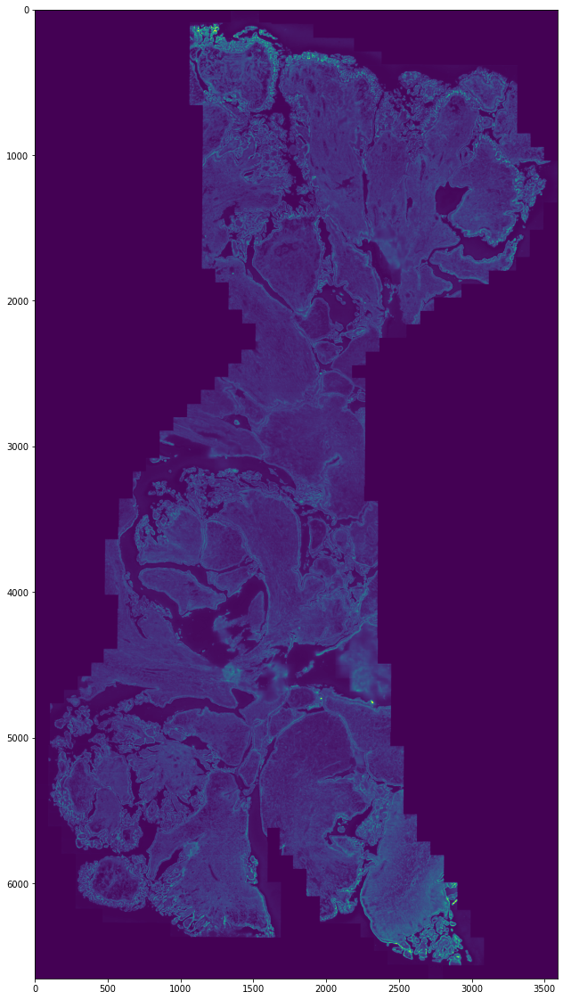

In [7]:
plt.figure(figsize=(20,20))
plt.imshow(resized, vmax=30000)

## Load Transcript Data
This section loads the transcript .csv file (detected_transcripts.csv) that contains the list of all detected transcripts in the sample where each row is a detected transcript. The column names and descriptions of what the column represents are:

barcode_id - internally used id of the gene. Each gene has a unique barcode_id
global_x, global_y - The global micron x and y coordinates of this transcript
x, y - The pixel coordinates of this transcript within the field of view
global_z - The index of the z slice that this transcript was detected in. Each z slice is separated by 1.5 microns
fov - the index of the field of view where this transcript was detected
gene - the gene name of this detected transcript

In [8]:
transcripts=  pd.read_csv(fs.open(os.path.join(
    dataPath, experimentName, 'detected_transcripts.csv')), index_col=0)

/home/ubuntu/anaconda3sce/envs/pegasus/lib/python3.8/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


### Plot key marker genes
In this section we select three highly expressed genes to visualize at a transcript level and assign colors for our interactive visualization. 

In [11]:
%%capture
# code for compressing data for visuals
import zlib, json, base64
def json_zip(j):
    zip_json_string = base64.b64encode(
        zlib.compress(
            json.dumps(j).encode('utf-8')
        )
    ).decode('ascii')
    return zip_json_string

# process data for interactive visual
keep_genes = gene_colors.keys()
transcripts_keep = transcripts[transcripts.gene.isin(keep_genes)]
transcripts_keep['-global_y'] = -transcripts_keep['global_y']

# rotate the mouse brain to the upright position
theta = np.deg2rad(-195) # -15
rot = np.array([[cos(theta), -sin(theta)], [sin(theta), cos(theta)]])
transcripts_keep[['global_x', '-global_y']] = transcripts_keep[['global_x', '-global_y']].dot(rot)

transcripts_keep['name'] = transcripts_keep['gene']
transcripts_keep['position'] = transcripts_keep[['global_x', '-global_y']].round(2).values.tolist()
transcripts_viz = deepcopy(transcripts_keep[['name', 'position']])
transcripts_string_zip = json_zip(transcripts_viz.to_dict('records'))

transcripts_inputs = {
          'zip_string': transcripts_string_zip,
          'radius_min_pixels': 1.0,
          'height': 800, 
          'gene_colors': gene_colors, 
          'min_zoom': -6
      }

In [12]:
embed('@vizgen/gene-transcripts-jupyter-v0-2-0', cells=['dashboard'], inputs=transcripts_inputs, display_logo=False)

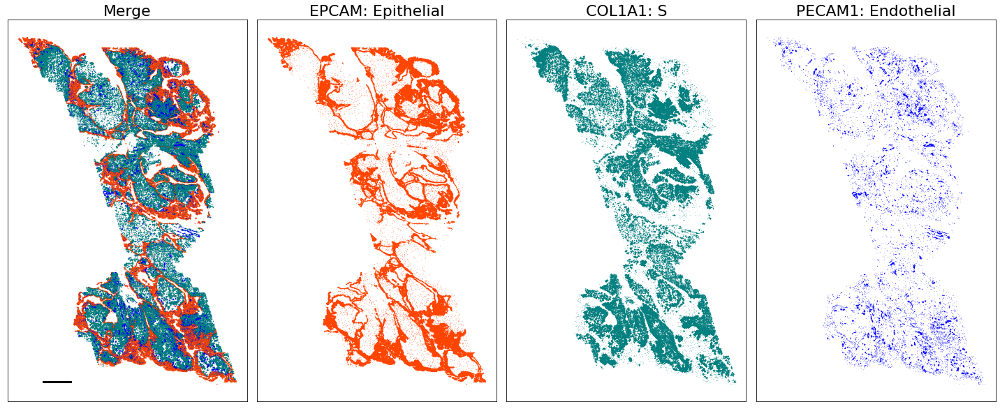

In [13]:

plt.rcParams['figure.figsize'] = [20, 16]

names=['Epithelial','S','Endothelial']
fontSize=22
tk=transcripts_keep
#tk=tk[(tk.global_x>-8000)&(tk.global_y<2000)]
plt.Figure()
count=1
for key in gene_colors.keys():
    plt.subplot(2, 4, count)
    #print(key)
    plt.scatter(tk.global_x[tk.gene==key],tk.global_y[tk.gene==key], color=gene_colors[key], s=0.01)
    plt.title('Merge', fontsize=fontSize)
    plt.xticks([])
    plt.yticks([])
    plt.hlines(y=50, xmin=-9000, xmax=-8000, linewidth=3, color='black')
count+=1
for key in gene_colors.keys():
    plt.subplot(2, 4, count)
    #print(key)
    plt.scatter(tk.global_x[tk.gene==key],tk.global_y[tk.gene==key], color=gene_colors[key], s=0.01)
    plt.title(key+': '+names[count-2], fontsize=fontSize)
    plt.xticks([])
    plt.yticks([])
    #plt.hlines(y=100, xmin=-8000, xmax=-7900, linewidth=3, color='black')

    count+=1
plt.tight_layout()
plt.savefig('./figs/tissue.pdf')
plt.show()

EPCAM
COL1A1
PECAM1


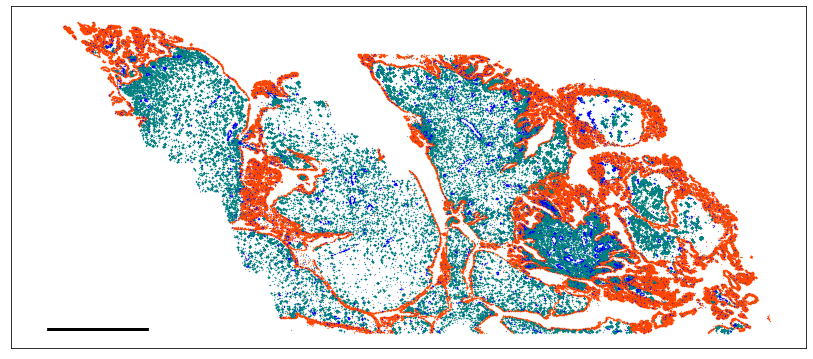

In [14]:

plt.rcParams['figure.figsize'] = [45, 10]

tk=transcripts_keep
tk=tk[(tk.global_x>-23000)&(tk.global_y>10000)]
plt.Figure()
count=1
for key in gene_colors.keys():
    plt.subplot(2, 4, count)
    print(key)
    plt.scatter(tk.global_x[tk.gene==key],tk.global_y[tk.gene==key], color=gene_colors[key], s=0.05)
    #plt.title('Overlay')
    plt.xticks([])
    plt.yticks([])
    plt.hlines(y=10050, xmin=-10000, xmax=-9000, linewidth=3, color='black')

plt.tight_layout()
plt.savefig('./figs/tissue_closeup.pdf')

plt.show()